![source.gif](source.gif)


<a id="cont"></a>

## Table of Contents
<a href=#zero>1.1. Introduction</a>
<a href=#one>1.2. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

## 1.1. Introduction

<a class='anchor' id="one">
<a href="#cont">Back to Table of Contents</a>

![Alt text](Advert.png) 

### Problem Statement

A product and service-based business aims to maximize its sales by effectively allocating resources towards advertising. To achieve this goal, accurate sales prediction plays a crucial role in strategic decision-making. The task at hand is to develop a machine learning model using Python to predict future sales based on advertising expenditures across various platforms, including TV, radio, and newspaper. The anticipated outcome is a robust predictive model that can assist the business in optimizing its advertising budget allocation, identifying the most effective advertising channels, and ultimately maximizing sales revenue. This model will serve as a valuable tool for data-driven decision-making, empowering the business to adapt its advertising strategies dynamically in response to changing market conditions and consumer behavior.

 <a id="one"></a>
## 1.2. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
![Alt text](Libraries.GIF)
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section we are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
#from pandas_profiling import ProfileReport

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
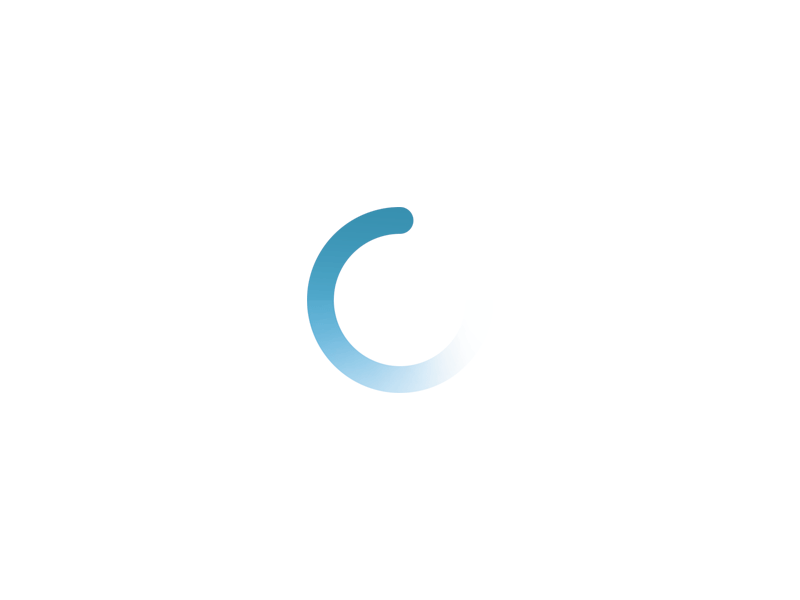    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `Advertising.csv` file into a DataFrame. |

---

In [5]:
Sales_data = pd.read_csv('Advertising.csv')

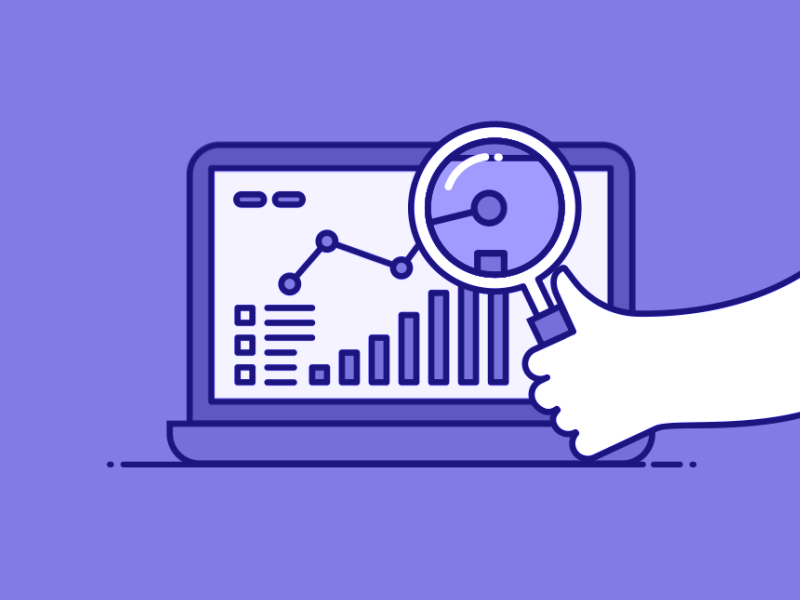

In [11]:
Sales_data.isnull().sum()

Unnamed: 0    0
TV            0
Radio         0
Newspaper     0
Sales         0
dtype: int64

In [12]:
Sales_data.nunique()

Unnamed: 0    200
TV            190
Radio         167
Newspaper     172
Sales         121
dtype: int64

In [13]:
Sales_data.duplicated().sum()

0

In [14]:
Sales_data.describe()

,Unnamed: 0,TV,Radio,Newspaper,Sales
count,200.000000,200.000000,200.000000,200.000000,200.000000
mean,100.500000,147.042500,23.264000,30.554000,14.022500
std,57.879185,85.854236,14.846809,21.778621,5.217457
min,1.000000,0.700000,0.000000,0.300000,1.600000
25%,50.750000,74.375000,9.975000,12.750000,10.375000
50%,100.500000,149.750000,22.900000,25.750000,12.900000
75%,150.250000,218.825000,36.525000,45.100000,17.400000
max,200.000000,296.400000,49.600000,114.000000,27.000000


<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
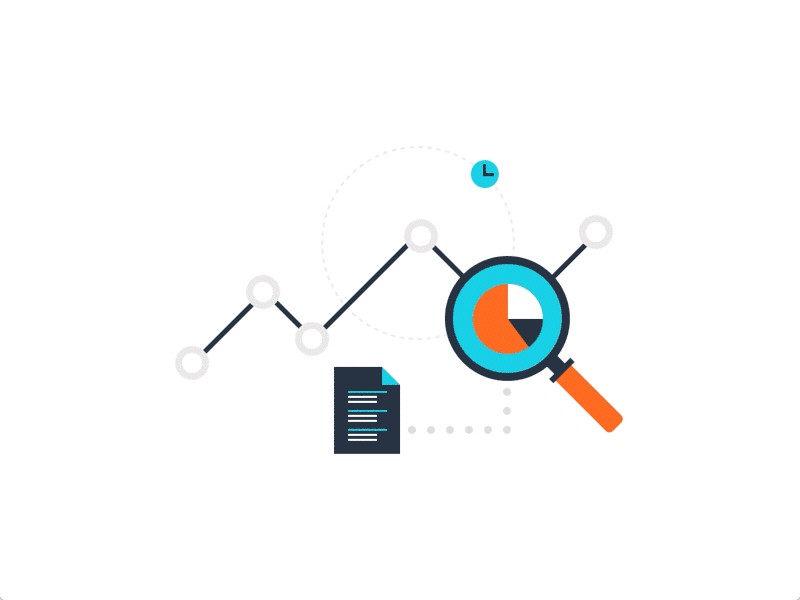    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, we are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


In [6]:
Sales_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,200.0,100.5000,57.879185,1.0,50.750,100.50,150.250,200.0
TV,200.0,147.0425,85.854236,0.7,74.375,149.75,218.825,296.4
Radio,200.0,23.2640,14.846809,0.0,9.975,22.90,36.525,49.6
Newspaper,200.0,30.5540,21.778621,0.3,12.750,25.75,45.100,114.0
Sales,200.0,14.0225,5.217457,1.6,10.375,12.90,17.400,27.0


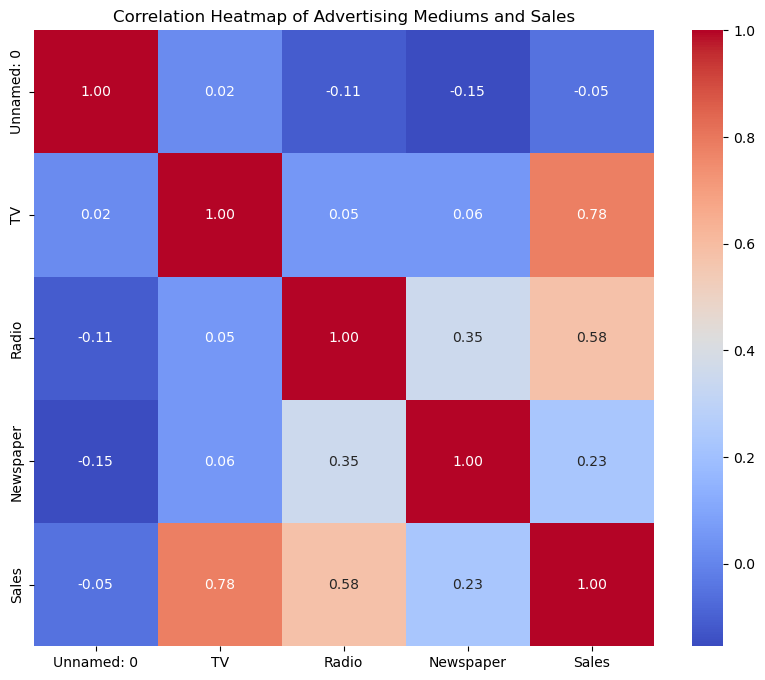

In [284]:
# Compute the correlation matrix
corr = Sales_data.corr()

# Generate a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Heatmap of Advertising Mediums and Sales')
plt.show()

TV advertising spending appears to have the strongest influence on sales compared to radio and newspaper advertising spending.
Radio advertising spending also shows a positive correlation with sales, but it's not as strong as TV advertising.
Newspaper advertising spending has the weakest correlation with sales among the three advertising mediums.

Therefore, Companies might consider allocating more resources towards TV advertising based on its stronger correlation with sales.

In [7]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Creating a DataFrame with the provided data
data = {
    'TV': [0.7, 74.375, 149.75, 218.825, 296.4],
    'Radio': [0.0, 9.975, 22.9, 36.525, 49.6],
    'Newspaper': [0.3, 12.75, 25.75, 45.1, 114.0],
    'Sales': [1.6, 10.375, 12.9, 17.4, 27.0]
}

df = pd.DataFrame(data)

# Adding a constant term for the intercept
df['Intercept'] = 1

# Defining independent and dependent variables
X = df[['Intercept', 'TV', 'Radio', 'Newspaper']]
y = df['Sales']

# Performing the multiple linear regression
model = sm.OLS(y, X)
results = model.fit()

# Printing the regression summary
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                  Sales   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.971
Method:                 Least Squares   F-statistic:                     45.74
Date:                Sat, 24 Feb 2024   Prob (F-statistic):              0.108
Time:                        10:47:10   Log-Likelihood:                -5.3836
No. Observations:                   5   AIC:                             18.77
Df Residuals:                       1   BIC:                             17.20
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.7123      1.606      1.066      0.4

D:\My Stuff\Documents\Lib\site-packages\statsmodels\stats\stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


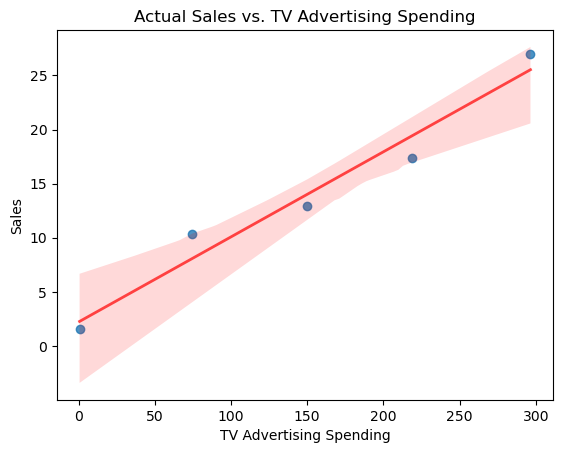

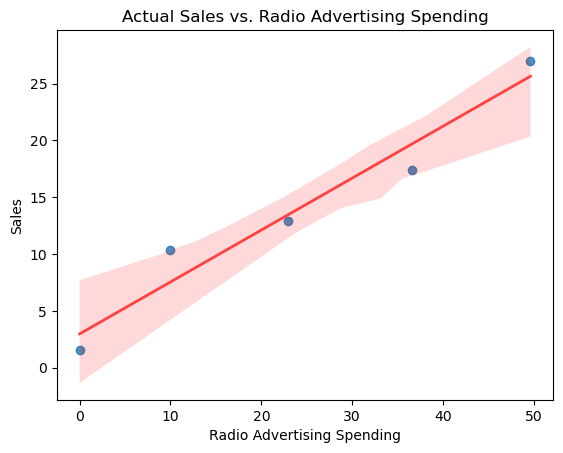

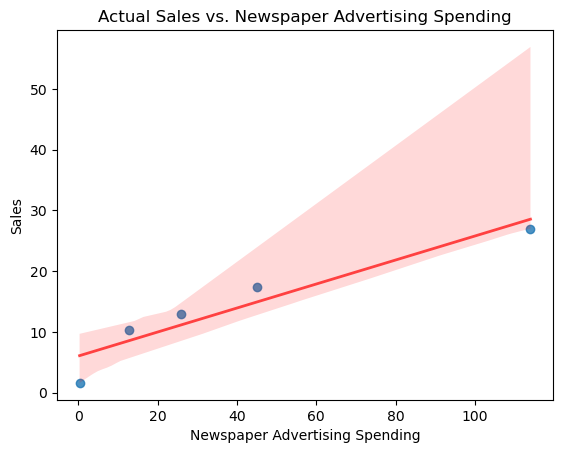

In [10]:
# Scatter plot of actual sales vs. TV advertising spending with regression line
sns.regplot(x='TV', y='Sales', data=df, line_kws={"color":"r","alpha":0.7,"lw":2})
plt.title('Actual Sales vs. TV Advertising Spending')
plt.xlabel('TV Advertising Spending')
plt.ylabel('Sales')
plt.show()

# Scatter plot of actual sales vs. Radio advertising spending with regression line
sns.regplot(x='Radio', y='Sales', data=df, line_kws={"color":"r","alpha":0.7,"lw":2})
plt.title('Actual Sales vs. Radio Advertising Spending')
plt.xlabel('Radio Advertising Spending')
plt.ylabel('Sales')
plt.show()

# Scatter plot of actual sales vs. Newspaper advertising spending with regression line
sns.regplot(x='Newspaper', y='Sales', data=df, line_kws={"color":"r","alpha":0.7,"lw":2})
plt.title('Actual Sales vs. Newspaper Advertising Spending')
plt.xlabel('Newspaper Advertising Spending')
plt.ylabel('Sales')
plt.show()

Overall, while the model has a very high R-squared value, indicating a strong fit to the data, the coefficients and the overall model may not be statistically significant due to the small sample size. Further analysis with a larger dataset would be necessary to draw more definitive conclusions about the relationship between advertising spending and sales. Additionally, other factors not included in the model may also influence sales and should be considered in future analyses

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
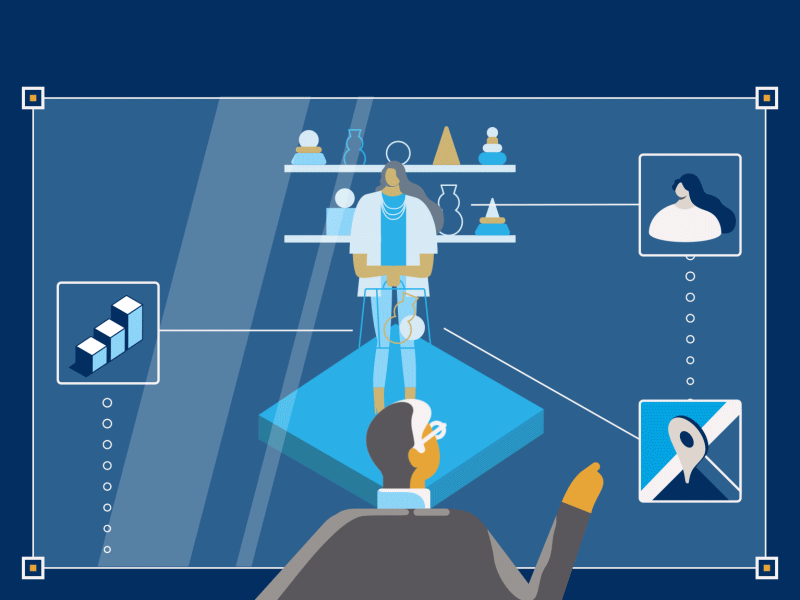
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section we are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

In [258]:
# We features (X) and target variable (y)
X = Sales_data.drop([ 'Sales', 'Unnamed: 0', 'Newspaper'], axis=1)  # Features
y = Sales_data['Sales']  # Target variable

### Scaling Numerical columns

In [116]:
# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the features
X_scaled = scaler.fit_transform(X)

### Logarithmic Transformation

In [247]:
X_log = np.log(X + 1)

### Square Root Transformation

In [259]:
X_sqrt = np.sqrt(X)

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
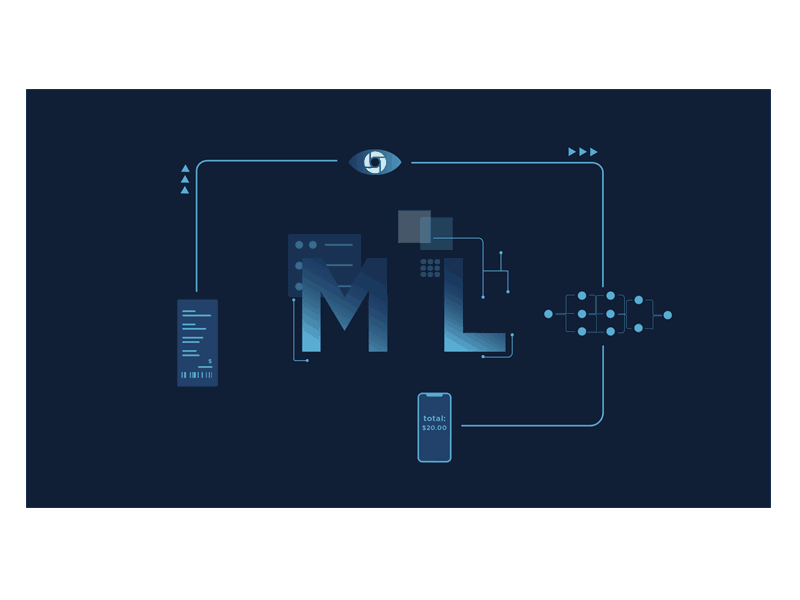    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, we are required to create one or more regression models that are able to accurately predict the selling price of the car. |

---


In [261]:
# Split the data into training and testing sets (90% train, 10% test)
X_train, X_test, y_train, y_test = train_test_split(X_sqrt , y, test_size=0.1, random_state=2)

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
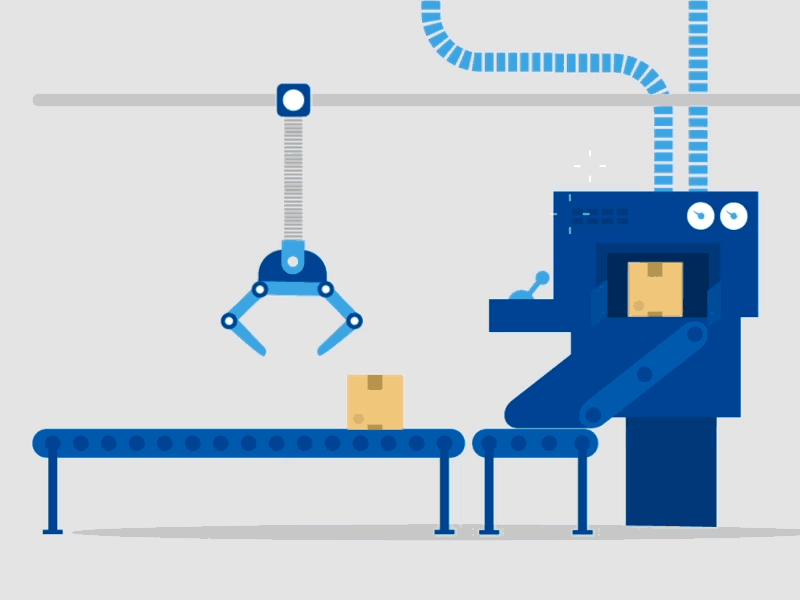    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section we are required to compare the relative performance of the various trained models on a holdout dataset and comment on what model is the best and why. |

---

## Linear Regression Model

### Model Evaluation: Train Data

In [101]:
# Instantiate the model (e.g., Linear Regression)
model = LinearRegression()

# Train the model on the training data
model.fit(X_train, y_train)

LinearRegression()

In [102]:
# Prediction on Training data
y_pred = model.predict(X_train)

In [103]:
error_score = r2_score(y_train, y_pred)
print(f"R-squared: {error_score}")

R-squared: 0.9025404481436667


### Model Evaluation: Test Data

In [104]:
# Prediction on Test data
y_test_pred = model.predict(X_test)

In [105]:
error_score = r2_score(y_test, y_test_pred)
print(f"R-squared: {error_score}")

R-squared: 0.8168984466015029


## Random Forests Model

### Model Evaluation: Train Data

In [263]:
# Train the Random Forests model
rf_model = RandomForestRegressor(n_estimators=100, bootstrap= True, random_state=422)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=422)

In [264]:
# Make predictions on the testing data
y_pred = rf_model.predict(X_train)

In [265]:
# Evaluate the model
mse = mean_squared_error(y_train, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.06664058888888859


### Model Evaluation: Test Data

In [266]:
# Train the Random Forests model
rf_model = RandomForestRegressor(n_estimators=100, bootstrap= True, random_state=422)
rf_model.fit(X_test, y_test)

RandomForestRegressor(random_state=422)

In [267]:
# Make predictions on the testing data
yt_pred = rf_model.predict(X_test)

In [268]:
# Evaluate the model
mse = mean_squared_error(y_test, yt_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.2583739000000015


<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
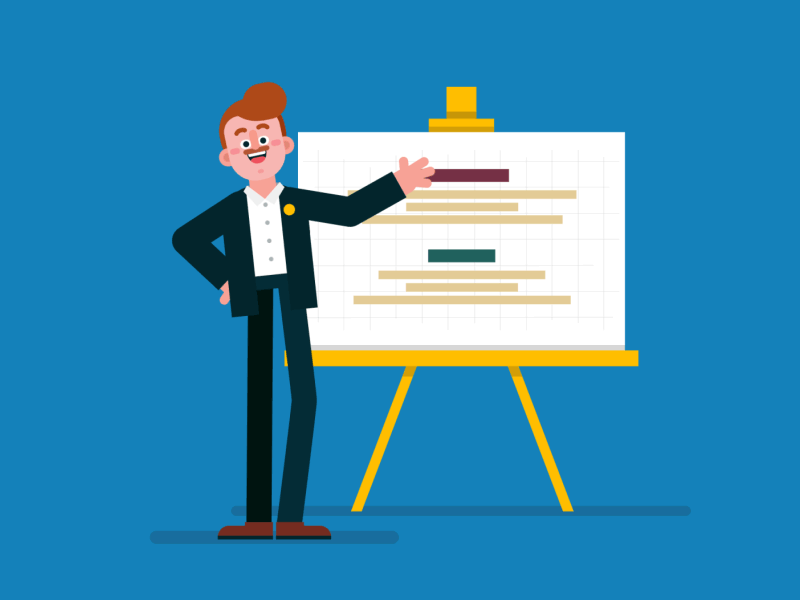    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, we are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

### Linear Regression Model

In [90]:
data = {
    'Feature_Engineering': ['Default','Standardize', 'Logarithmic', 'Squared Root'],
    'Train_data(R-Squared)': [0.90, 0.84, 0.90],
    'Test_data(R-Squared)': [0.81, 0.91, 0.91]
}

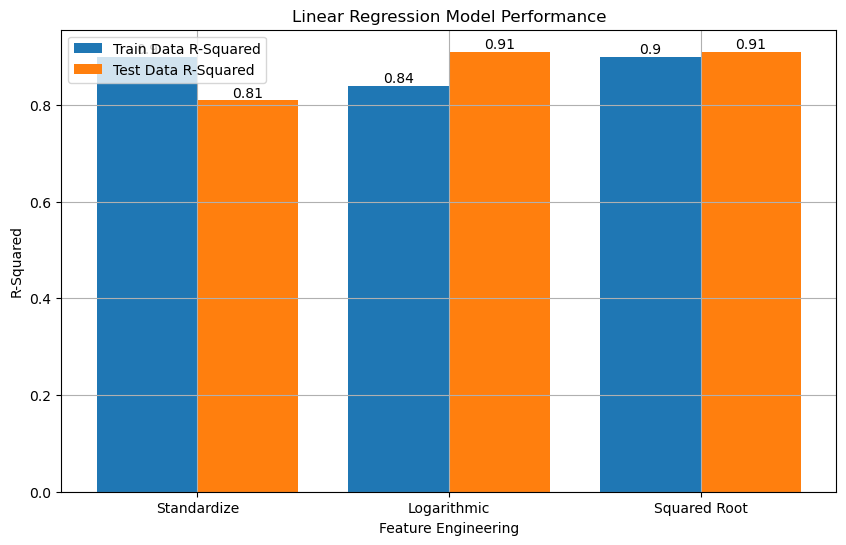

In [96]:
# Provided data
feature_engineering = ['Standardize', 'Logarithmic', 'Squared Root']
train_r_squared = [0.90, 0.84, 0.90]
test_r_squared = [0.81, 0.91, 0.91]

# Plotting
plt.figure(figsize=(10, 6))

# Plot train R-squared
bars_train = plt.bar([x - 0.2 for x in range(len(feature_engineering))], train_r_squared, width=0.4, label='Train Data R-Squared')

# Plot test R-squared
bars_test = plt.bar([x + 0.2 for x in range(len(feature_engineering))], test_r_squared, width=0.4, label='Test Data R-Squared')

# Add numerical values on the bars
for bar in bars_train:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center')

for bar in bars_test:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center')

# Add x-axis labels
plt.xticks(range(len(feature_engineering)), feature_engineering)

# Add labels and title
plt.xlabel('Feature Engineering')
plt.ylabel('R-Squared')
plt.title('Linear Regression Model Performance')
plt.legend()

# Show plot
plt.grid(True)
plt.show()

This the performance of a linear regression model trained with different feature engineering techniques. When interpreting these results the logarithmic feature engineering technique performs slightly better than others, as it has the highest R-squared value for both train and test data. However, it's important to note that the choice of feature engineering technique should be based on various factors including model interpretability, computational efficiency, and domain knowledge.

### Random Forest model

In [272]:
df = {
    'Feature_Engineering': ['Default', 'n_estmiator', 'bootstrap'],
    'Train_data(MSE)': [0.064, 0.069, 0.069],
    'Test_data(MSE)': [0.249, 0.23, 0.23 ]
}

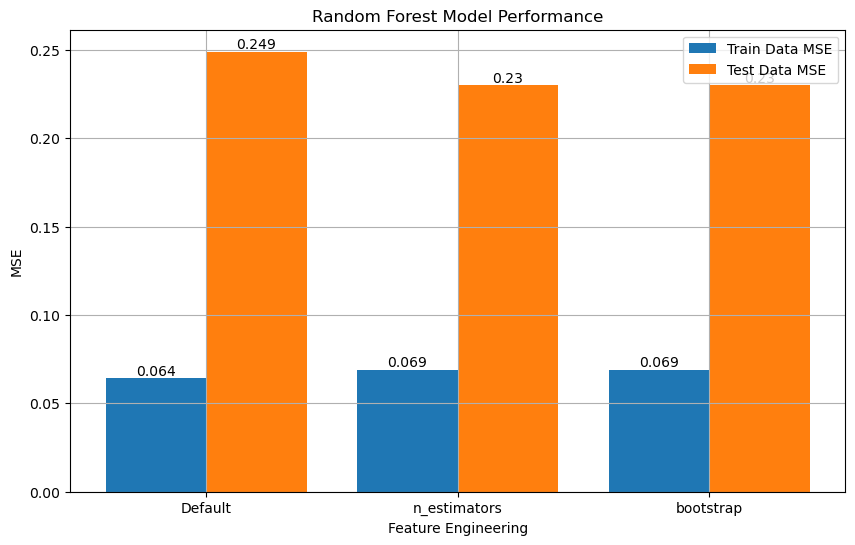

In [274]:
# Data
feature_engineering = ['Default', 'n_estimators', 'bootstrap']
train_mse = [0.064, 0.069, 0.069]
test_mse = [0.249, 0.23, 0.23]

# Plotting
plt.figure(figsize=(10, 6))

# Plot train MSE
bars_train = plt.bar([x - 0.2 for x in range(len(feature_engineering))], train_mse, width=0.4, label='Train Data MSE')

# Plot test MSE
bars_test = plt.bar([x + 0.2 for x in range(len(feature_engineering))], test_mse, width=0.4, label='Test Data MSE')

# Add numerical values on the bars
for bar in bars_train:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 3), va='bottom', ha='center')

for bar in bars_test:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 3), va='bottom', ha='center')

# Add x-axis labels
plt.xticks(range(len(feature_engineering)), feature_engineering)

# Add labels and title
plt.xlabel('Feature Engineering')
plt.ylabel('MSE')
plt.title('Random Forest Model Performance')
plt.legend()

# Show plot
plt.grid(True)
plt.show()

The results indicate that adjusting the number of estimators may have a slight positive impact on the model's generalization performance, as evidenced by the decrease in testing MSE. However, further analysis, such as cross-validation or testing on additional datasets, would be necessary to confirm the robustness and reliability of these findings. Additionally, other hyperparameters and feature engineering techniques should also be explored to potentially improve the model's performance further.

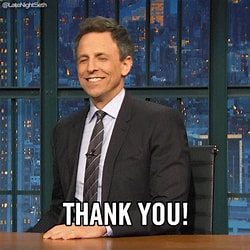


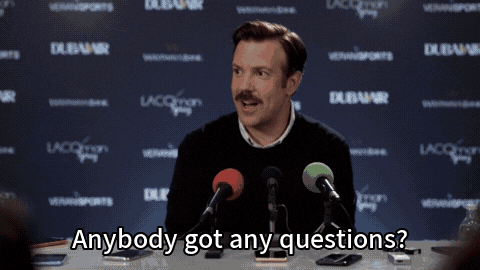
